# Programming Project #1: Hybrid Images

# CS445: Computational Photography - Spring 2020
## Saurav Chetry
## schetry2@illinois.edu

### Part I: Hybrid Images

In [1]:
import cv2

import numpy as np
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from scipy import signal
import utils
from PIL import Image, ImageEnhance
import statistics as st

In [2]:
%matplotlib notebook
import matplotlib.pyplot as plt

In [3]:
im1_file = './stones.jpg'
im2_file = './dance.jpg'
im3_file = './mountain.jpg'
im4_file = './city.jpg'
im5_file = './boy.jpg'
im6_file = './man.jpg'
im7_file = './boy.jpg'
im8_file = './man.jpg'



im1 = cv2.imread(im1_file, cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread(im2_file, cv2.IMREAD_GRAYSCALE) ## for color hybrid
im3 = cv2.imread(im3_file) ## for color hybrid
im4 = cv2.imread(im4_file) ## for color hybrid
im5 = cv2.imread(im5_file, cv2.IMREAD_GRAYSCALE)
im6 = cv2.imread(im6_file, cv2.IMREAD_GRAYSCALE)
im7 = cv2.imread(im7_file) ## for color hybrid
im8 = cv2.imread(im8_file, cv2.IMREAD_GRAYSCALE)





<IPython.core.display.Javascript object>


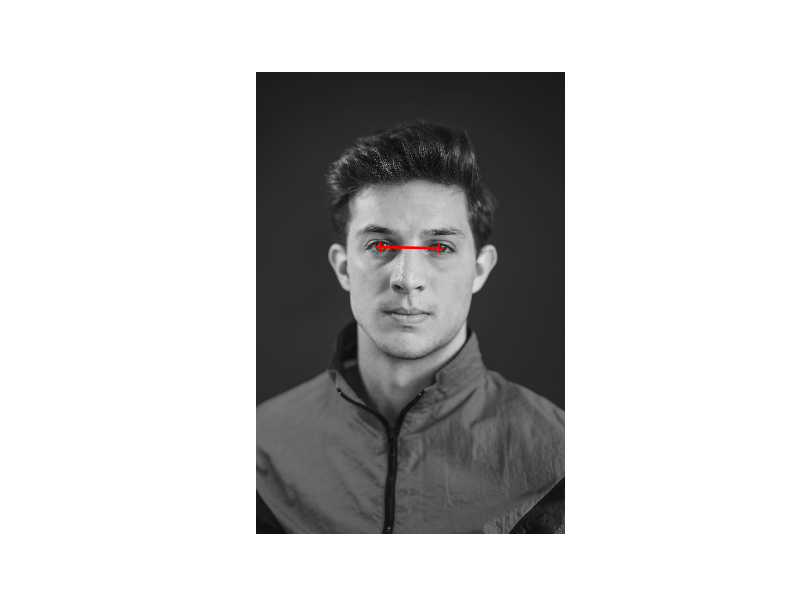

In [4]:
pts_im1_g = utils.prompt_eye_selection(im5)


<IPython.core.display.Javascript object>


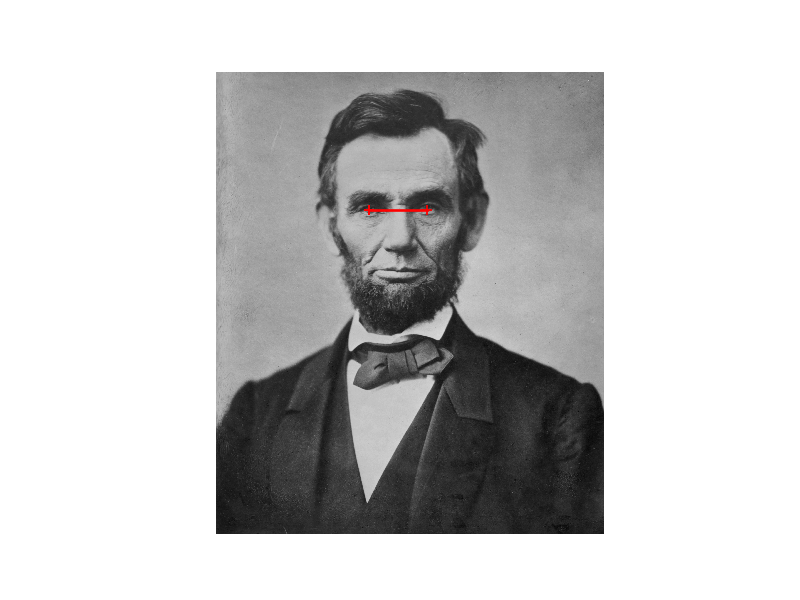

In [5]:
pts_im2_g = utils.prompt_eye_selection(im6)

<IPython.core.display.Javascript object>


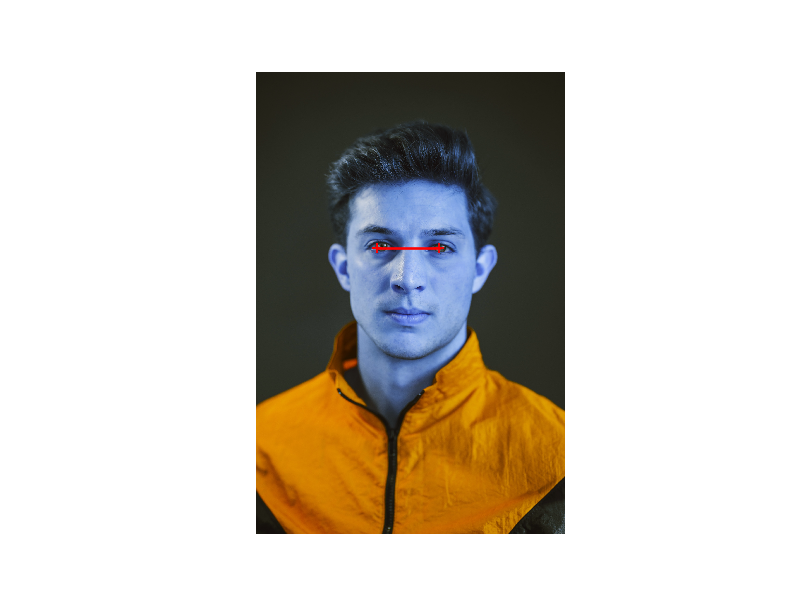

In [6]:
pts_im1_c = utils.prompt_eye_selection(im7) #for color hybrid


<IPython.core.display.Javascript object>


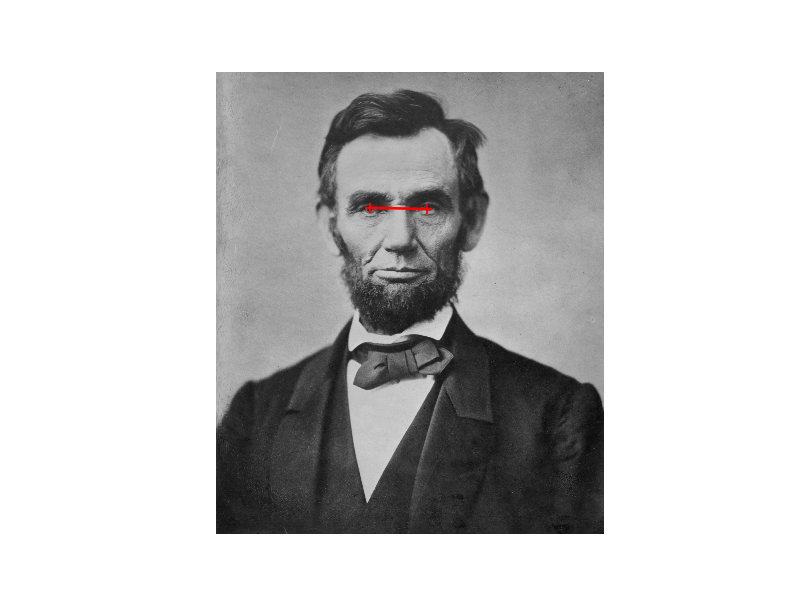

In [7]:
pts_im2_c = utils.prompt_eye_selection(im8)

In [8]:
im1_g, im2_g = utils.align_images(im5_file, im6_file,pts_im1_g,pts_im2_g,save_images=False)

In [9]:
im1_c, im2_c = utils.align_images(im7_file, im8_file,pts_im1_c,pts_im2_c,save_images=False) # for color hybrid

In [10]:
# convert to grayscale
im1_g = cv2.cvtColor(im1_g, cv2.COLOR_BGR2GRAY) / 255.0
im2_g = cv2.cvtColor(im2_g, cv2.COLOR_BGR2GRAY) / 255.0



In [11]:
#####color hybrid adjustments

im2_c = cv2.cvtColor(im2_c, cv2.COLOR_BGR2GRAY) / 255.0
im2_rgb = np.stack((im2_c, im2_c, im2_c), axis=2)

#print(im2_rgb.shape)


<IPython.core.display.Javascript object>


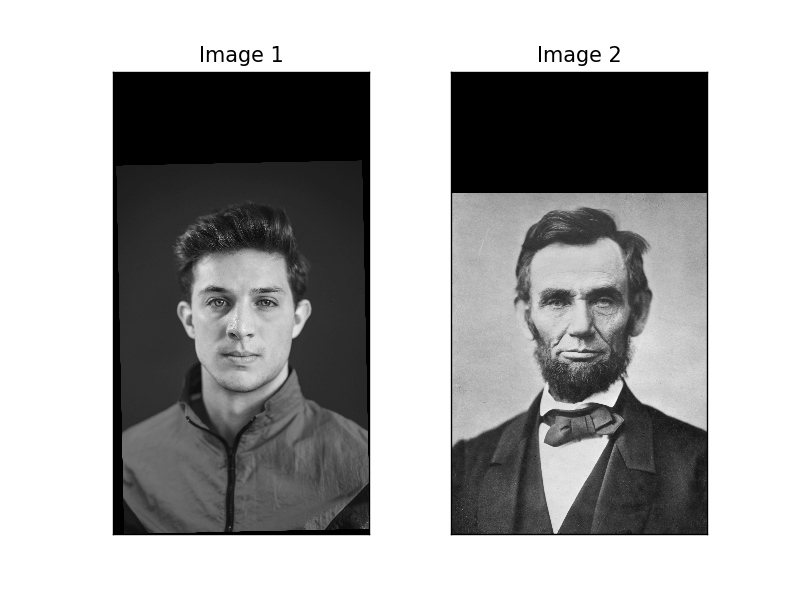

In [12]:
#Images sanity check
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1_g,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2_g,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

<IPython.core.display.Javascript object>


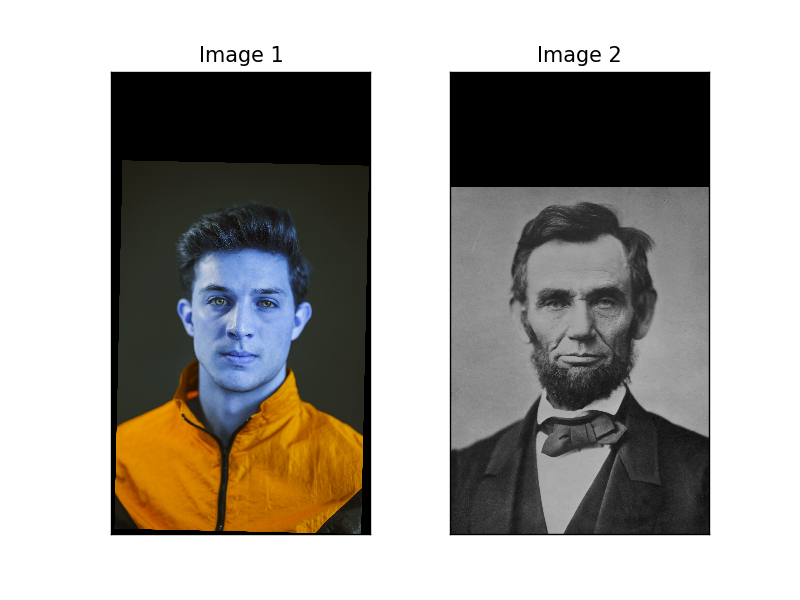

In [13]:
#Images sanity check ## color hybrid only
fig, axes = plt.subplots(1, 2)
axes[0].imshow(im1_c,cmap='gray')
axes[0].set_title('Image 1'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(im2_rgb,cmap='gray')
axes[1].set_title('Image 2'), axes[1].set_xticks([]), axes[1].set_yticks([]);

<IPython.core.display.Javascript object>


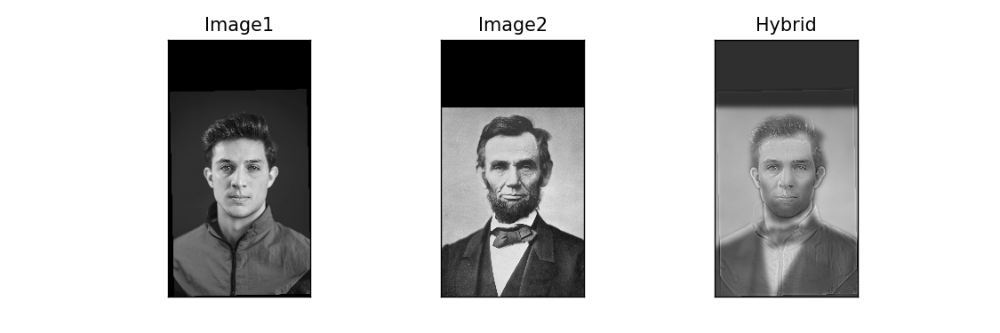

([], <a list of 0 Text yticklabel objects>)

In [14]:
##for grayscale

def hybridImage(img1, img2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''    
    lpf_low = utils.gaussian_kernel(cutoff_low, 3*cutoff_low)
    
    #print(im1.shape)
    
    lpf_high = utils.gaussian_kernel(cutoff_high, 3*cutoff_high)
    
    #print(im2.shape)
    
    #im_low = signal.convolve2d(im2,lpf_low,mode='same',boundary='symm')
    #im_hi = im1 - signal.convolve2d(im1,lpf_high,mode='same',boundary='symm')
    
    im_low = cv2.filter2D(img2,-1,lpf_low)
      
    #im_low = np.stack((im_low, im_low, im_low), axis=2)
    
    #print(im_low.shape)
    
    im_hi = img1 - cv2.filter2D(img1,-1,lpf_high)  
    
    #print(im_hi.shape)
    
 
    
    #im_low = cv2.cvtColor(im_low, cv2.COLOR_BGR2GRAY)
    #im_low = cv2.cvtColor(im_hi, cv2.COLOR_BGR2RGB)
    return im_low + im_hi


arbitrary_value = 20  # you should choose meaningful values; you might want to set to a fraction of image size
cutoff_low = 45
cutoff_high = 25
im_hybrid = hybridImage(im1_g,im2_g,  cutoff_low, cutoff_high)

plt.figure(figsize=(9,3))

plt.subplot(131)
plt.imshow(im1_g,cmap='gray')
plt.title('Image1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(132)
plt.imshow(im2_g,cmap='gray')
plt.title('Image2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(133)
plt.imshow(im_hybrid,cmap='gray')
plt.title('Hybrid')
plt.xticks([], [])
plt.yticks([], [])




<IPython.core.display.Javascript object>


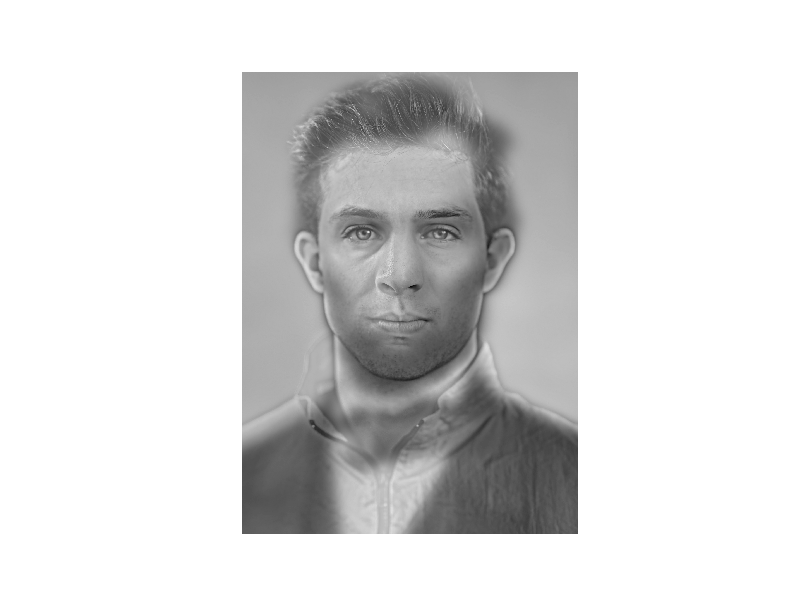

In [15]:

# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(im_hybrid)

##FFT of the best hybrid image

<IPython.core.display.Javascript object>


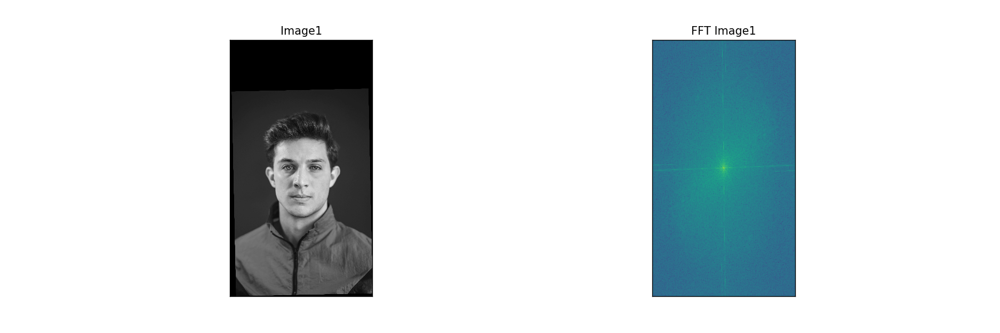

([], <a list of 0 Text yticklabel objects>)

In [16]:
lpf_low = utils.gaussian_kernel(cutoff_low, 3*cutoff_low)   
lpf_high = utils.gaussian_kernel(cutoff_high, 3*cutoff_high)
    
im_low = cv2.filter2D(im2_g,-1,lpf_low)   
im_hi = im1_g - cv2.filter2D(im1_g,-1,lpf_high)

plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(im1_g,cmap = 'gray')
plt.title('Image1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(122)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im1_g)))))
plt.title('FFT Image1')
plt.xticks([], [])
plt.yticks([], [])

<IPython.core.display.Javascript object>


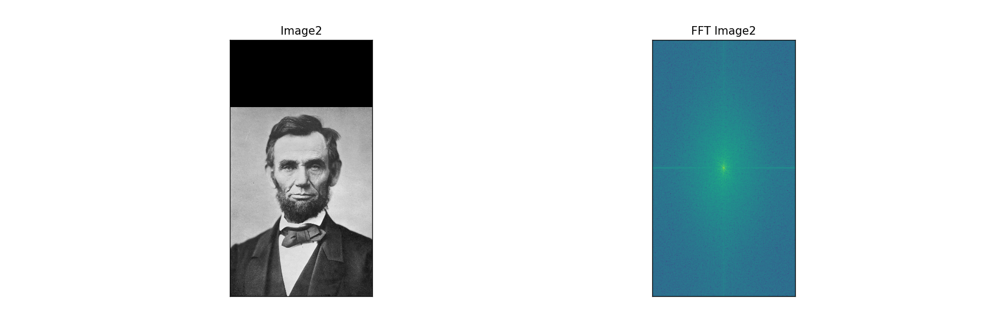

([], <a list of 0 Text yticklabel objects>)

In [17]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(im2_g,cmap = 'gray')
plt.title('Image2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(122)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im2_g)))))
plt.title('FFT Image2')
plt.xticks([], [])
plt.yticks([], [])

<IPython.core.display.Javascript object>


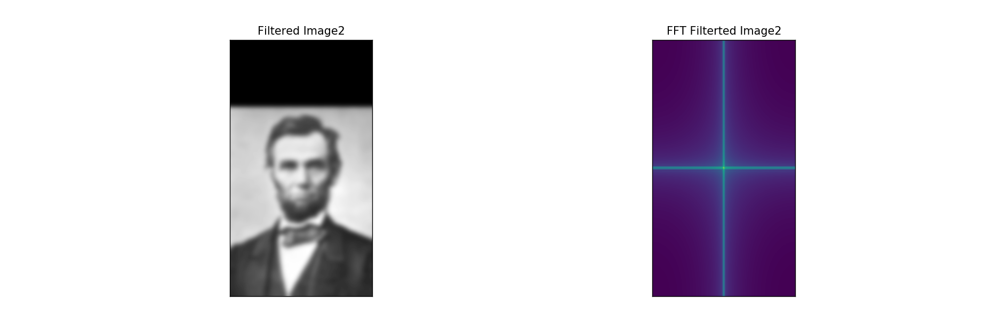

([], <a list of 0 Text yticklabel objects>)

In [18]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(im_low,cmap = 'gray')
plt.title('Filtered Image2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(122)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im_low)))))
plt.title('FFT Filterted Image2')
plt.xticks([], [])
plt.yticks([], [])

<IPython.core.display.Javascript object>


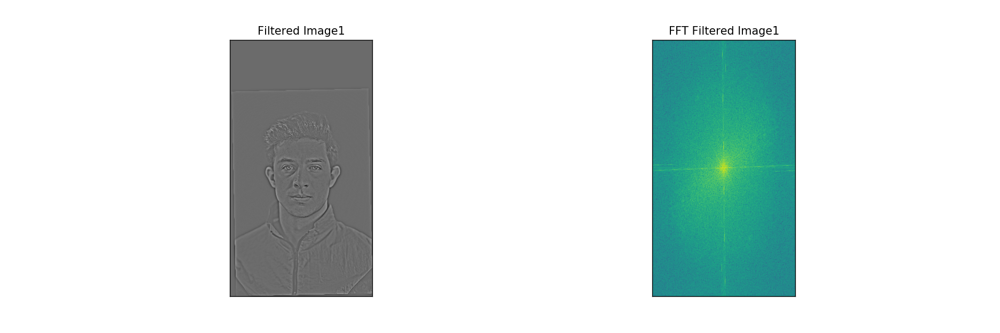

([], <a list of 0 Text yticklabel objects>)

In [19]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(im_hi,cmap = 'gray')
plt.title('Filtered Image1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(122)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im_hi)))))
plt.title('FFT Filtered Image1')
plt.xticks([], [])
plt.yticks([], [])

<IPython.core.display.Javascript object>


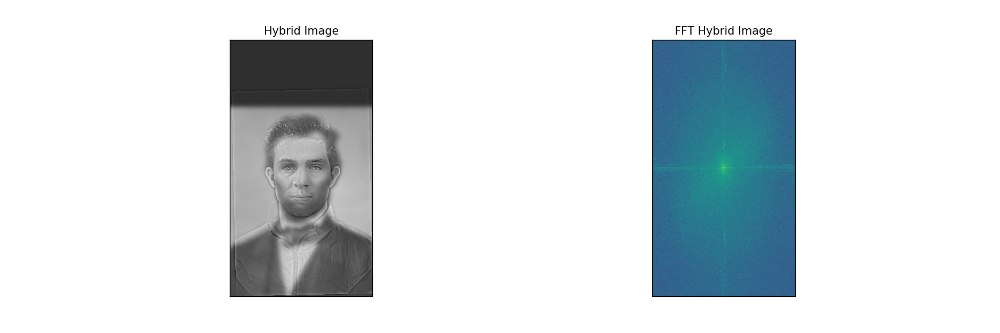

([], <a list of 0 Text yticklabel objects>)

In [20]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(im_hybrid,cmap = 'gray')
plt.title('Hybrid Image')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(122)
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(im_hybrid)))))
plt.title('FFT Hybrid Image')
plt.xticks([], [])
plt.yticks([], [])


### Part II: Image Enhancement

##### Two out of three types of image enhancement are required.  Choose a good image to showcase each type and implement a method.  This code doesn't rely on the hybrid image part.

#### Contrast enhancement

<IPython.core.display.Javascript object>


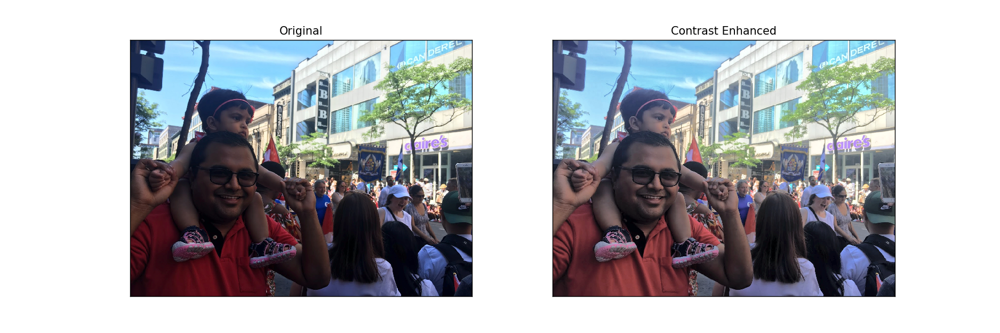

In [21]:
## improving contrast via histogram equalization

im_raw = cv2.imread("IMG_4318.jpg", cv2.IMREAD_COLOR)
im_raw_lab = cv2.cvtColor(im_raw, cv2.COLOR_BGR2LAB)
im_orig = im_raw_lab.copy()


im_raw_lab[:,:,0]= cv2.equalizeHist(im_raw_lab[:,:,0])

fig, axes = plt.subplots(1, 2, figsize=(15,5))
axes[0].imshow(cv2.cvtColor(im_orig, cv2.COLOR_LAB2RGB))
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(im_raw_lab, cv2.COLOR_LAB2RGB))
axes[1].set_title('Contrast Enhanced'), axes[1].set_xticks([]), axes[1].set_yticks([]);



<IPython.core.display.Javascript object>


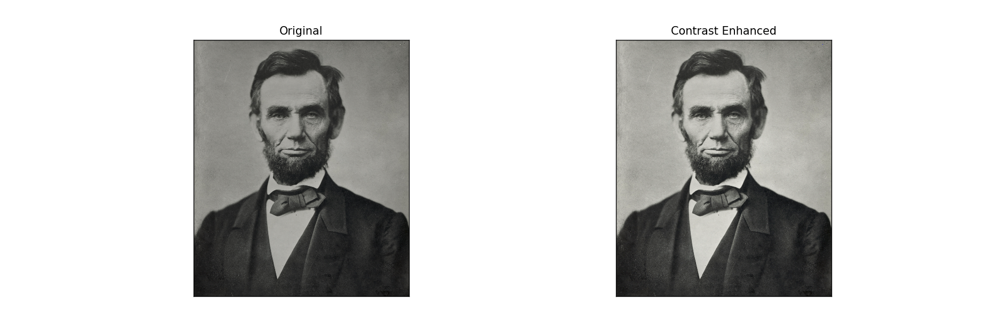

In [22]:
## improving contrast via gamma correction

im_raw = cv2.imread("man.jpg", cv2.IMREAD_COLOR)
im_orig = im_raw.copy()

# gamma-correction

im_raw = im_raw**1.04

#cv2.imwrite("cotrast_adjusted.jpg", im_raw)

fig, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].imshow(cv2.cvtColor(im_orig.astype(np.uint8), cv2.COLOR_BGR2RGB))
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(im_raw.astype(np.uint8), cv2.COLOR_BGR2RGB))
axes[1].set_title('Contrast Enhanced'), axes[1].set_xticks([]), axes[1].set_yticks([]);



#### Color enhancement 

<IPython.core.display.Javascript object>


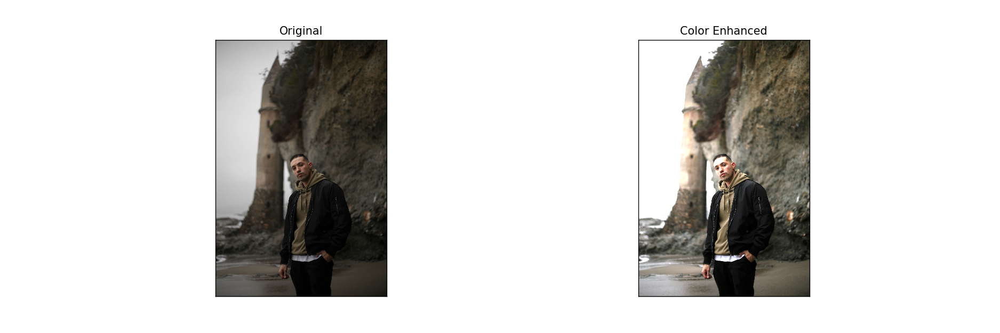

In [23]:
#color enhancing with linear adjustment method

im_raw = cv2.imread("dark.jpg",cv2.IMREAD_COLOR)
im_orig = im_raw.copy()

im_enh = im_raw.copy()

b = im_raw[:,:,0]
g = im_raw[:,:,1]
r = im_raw[:,:,2]

mv = np.mean(im_raw)
mv_b = np.mean(im_raw[:,:,0])
mv_g = np.mean(im_raw[:,:,1])
mv_r = np.mean(im_raw[:,:,2])

alpha_b = mv/mv_b
alpha_g = mv/mv_g
alpha_r = mv/mv_r

tmp = np.zeros_like(im_raw)
for i in range(im_raw.shape[0]):
    for j in range(im_raw.shape[1]):
        tmp[i,j,0] = im_raw[i,j,0]*alpha_b
        tmp[i,j,1] = im_raw[i,j,1]*alpha_g
        tmp[i,j,2] = im_raw[i,j,2]*alpha_r     


im_enh = cv2.add(im_enh,tmp)

fig, axes = plt.subplots(1, 2, figsize=(15,5))
axes[0].imshow(cv2.cvtColor(im_orig, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(im_enh,cv2.COLOR_BGR2RGB))
axes[1].set_title('Color Enhanced'), axes[1].set_xticks([]), axes[1].set_yticks([]);


<IPython.core.display.Javascript object>


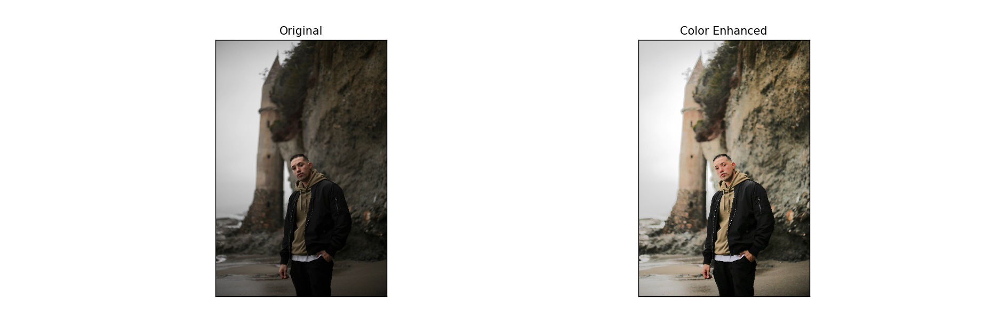

In [24]:
## color enhancing via histogram equalization in HSV space

im_raw = cv2.imread("dark.jpg", cv2.IMREAD_COLOR)
im_raw_hsv = cv2.cvtColor(im_raw, cv2.COLOR_BGR2HSV)
im_orig = im_raw_hsv.copy()

im_h = im_raw_hsv[:,:,0]
im_s = im_raw_hsv[:,:,1]
im_v = cv2.equalizeHist(im_raw_hsv[:,:,2])

im_col_ehn = cv2.merge((im_h,im_s,im_v))


fig, axes = plt.subplots(1, 2, figsize=(15,5))
axes[0].imshow(cv2.cvtColor(im_orig, cv2.COLOR_HSV2RGB))
axes[0].set_title('Original'), axes[0].set_xticks([]), axes[0].set_yticks([])
axes[1].imshow(cv2.cvtColor(im_col_ehn, cv2.COLOR_HSV2RGB))
axes[1].set_title('Color Enhanced'), axes[1].set_xticks([]), axes[1].set_yticks([]);





##Bells & Whistles



<IPython.core.display.Javascript object>


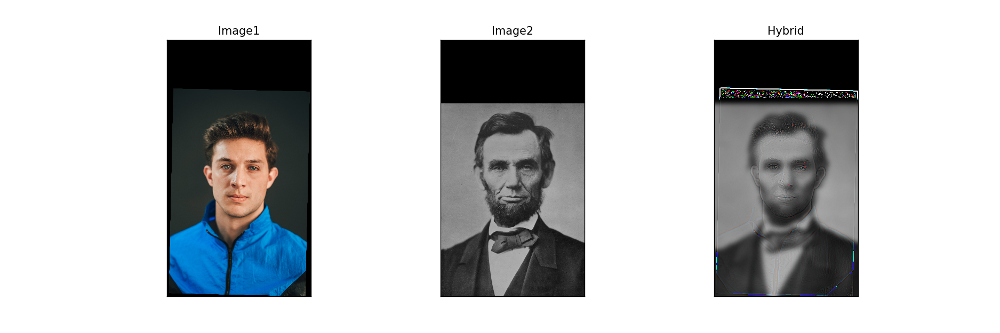

([], <a list of 0 Text yticklabel objects>)

In [28]:
##Effect of color on hybrid

def colorhybridImage(img1, img2, cutoff_low, cutoff_high):
    '''
    Inputs:
        im1:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        im2:    RGB (height x width x 3) or a grayscale (height x width) image
                as a numpy array.
        cutoff_low: standard deviation for the low-pass filter
        cutoff_high: standard deviation for the high-pass filter
        
    Output:
        Return the combination of both images, one filtered with a low-pass filter
        and the other with a high-pass filter.
    '''    
    lpf_low = utils.gaussian_kernel(cutoff_low, 3*cutoff_low)
      
    lpf_high = utils.gaussian_kernel(cutoff_high, 3*cutoff_high)
    
    
    
    im_low = cv2.filter2D(img2,-1,lpf_low)
 
    im_hi = img1 - cv2.filter2D(img1,-1,lpf_high)  
    
    return im_low*255 + im_hi


cutoff_low = 45
cutoff_high = 10
im_hybrid_color = colorhybridImage(im1_c,im2_rgb,  cutoff_low, cutoff_high)

plt.figure(figsize=(15,5))

plt.subplot(131)
plt.imshow(cv2.cvtColor(im1_c.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Image1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(132)
plt.imshow(im2_rgb)
plt.title('Image2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(133)
plt.imshow(cv2.cvtColor(im_hybrid_color.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Hybrid')
plt.xticks([], [])
plt.yticks([], [])









<IPython.core.display.Javascript object>


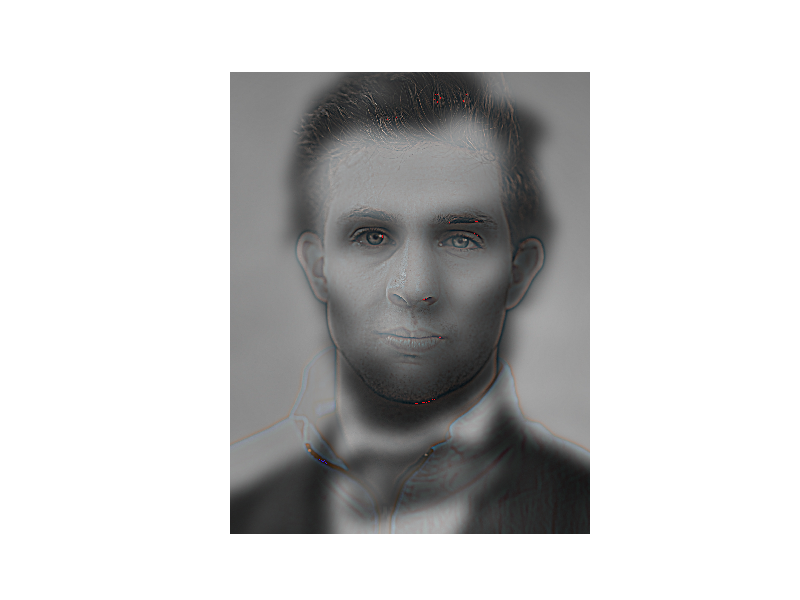

In [31]:
# Optional: Select top left corner and bottom right corner to crop image
# the function returns dictionary of 
# {
#   'cropped_image': np.ndarray of shape H x W
#   'crop_bound': np.ndarray of shape 2x2
# }
cropped_object = utils.interactive_crop(cv2.cvtColor(im_hybrid_color.astype(np.uint8), cv2.COLOR_BGR2RGB))
im_hybrid = cv2.cvtColor(im_hybrid_color.astype(np.uint8), cv2.COLOR_BGR2RGB)

#### Color shift

<IPython.core.display.Javascript object>


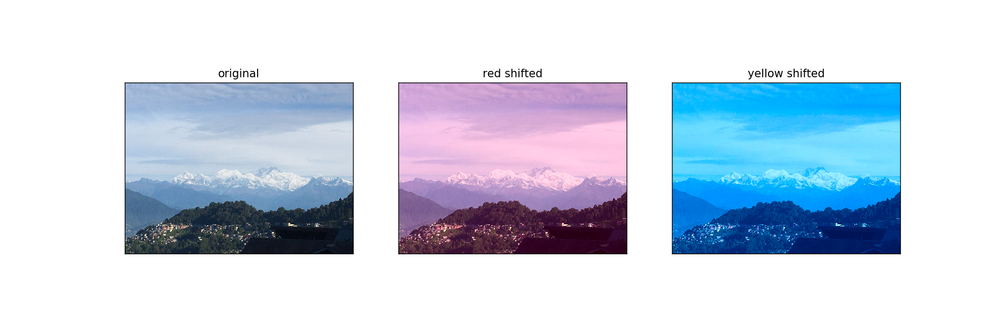

In [25]:
im_raw = cv2.imread("darj.jpg", cv2.IMREAD_COLOR)


im_lab = cv2.cvtColor(im_raw, cv2.COLOR_BGR2Lab)

im_red = im_lab.copy()
im_yel = im_lab.copy()

im_red[:,:,1] = im_lab[:,:,1] + im_lab[:,:,1]* 0.2  # increasing the "a" channel to increase redness

im_yel[:,:,2] = im_lab[:,:,2] - im_lab[:,:,2]* 0.4  # decreasing the "b" channel to decrease yellowness



plt.figure(figsize=(15,5))


plt.subplot(131)
plt.imshow(cv2.cvtColor(im_lab, cv2.COLOR_Lab2RGB))
plt.title('original')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(132)
plt.imshow(cv2.cvtColor(im_red, cv2.COLOR_Lab2RGB))
plt.title('red shifted')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(133)
plt.imshow(cv2.cvtColor(im_yel, cv2.COLOR_Lab2RGB))
plt.title('yellow shifted')
plt.xticks([], [])
plt.yticks([], [])

plt.show()



    

## Gaussian Pyramid

<IPython.core.display.Javascript object>


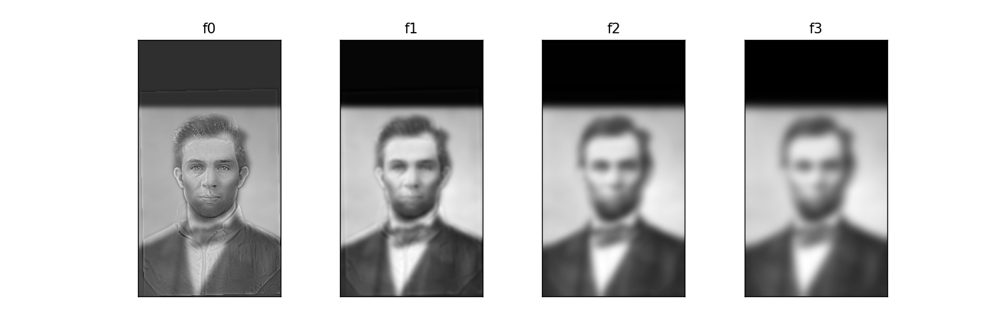

In [26]:
cutoff_low = 25
lpf_low = utils.gaussian_kernel(cutoff_low, 3*cutoff_low)

scale_percent = 50 # percent of original size
width = int(im_hybrid.shape[1] * scale_percent / 100)
height = int(im_hybrid.shape[0] * scale_percent / 100)
dim = (width, height)

im_blur1 = cv2.filter2D(im_hybrid,-1,lpf_low)
im_sub1 = cv2.resize(im_blur1, dim, interpolation = cv2.INTER_NEAREST)

im_blur2 = cv2.filter2D(im_sub1,-1,lpf_low)
im_sub2 = cv2.resize(im_blur2, dim, interpolation = cv2.INTER_NEAREST)

im_blur3 = cv2.filter2D(im_sub2,-1,lpf_low)
im_sub3 = cv2.resize(im_blur3, dim, interpolation = cv2.INTER_NEAREST)

im_blur4 = cv2.filter2D(im_sub3,-1,lpf_low)
im_sub4 = cv2.resize(im_blur4, dim, interpolation = cv2.INTER_NEAREST)



plt.figure(figsize=(12,4))


plt.subplot(141)
plt.imshow(im_hybrid,cmap = 'gray')
plt.title('f0')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(142)
plt.imshow(im_sub1,cmap = 'gray')
plt.title('f1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(143)
plt.imshow(im_sub2,cmap = 'gray')
plt.title('f2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(144)
plt.imshow(im_sub3,cmap = 'gray')
plt.title('f3')
plt.xticks([], [])
plt.yticks([], [])

plt.show()







## Laplacian Pyramid

<IPython.core.display.Javascript object>


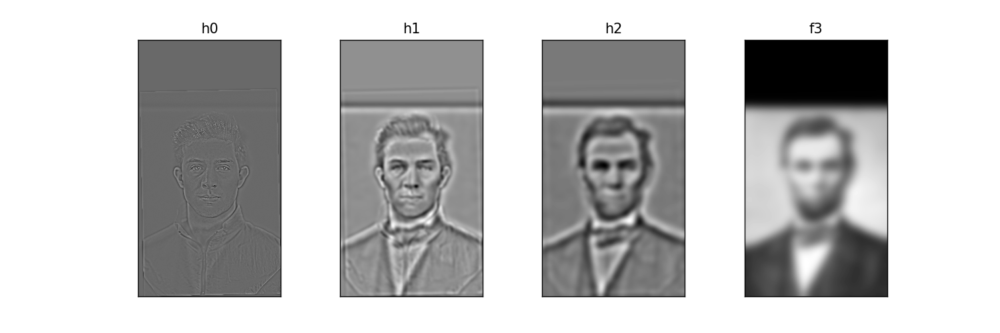

In [27]:
cutoff_low = 25
lpf_low = utils.gaussian_kernel(cutoff_low, 3*cutoff_low)

scale_percent = 50 # percent of original size
width = int(im_hybrid.shape[1] * scale_percent / 100)
height = int(im_hybrid.shape[0] * scale_percent / 100)
dim = (width, height)

im_blur1 = cv2.filter2D(im_hybrid,-1,lpf_low)
im_sharp1 = im_hybrid - im_blur1

im_sub1 = cv2.resize(im_blur1, dim, interpolation = cv2.INTER_NEAREST)
im_blur2 = cv2.filter2D(im_sub1,-1,lpf_low)
im_sharp2 = im_sub1 - im_blur2

im_sub2 = cv2.resize(im_blur2, dim, interpolation = cv2.INTER_NEAREST)
im_blur3 = cv2.filter2D(im_sub2,-1,lpf_low)
im_sharp3 = im_sub2 - im_blur3

im_sub3 = cv2.resize(im_blur3, dim, interpolation = cv2.INTER_NEAREST)
#im_blur4 = cv2.filter2D(im_sub3,-1,lpf_low)
#im_sharp4 = im_sub3 - im_blur4

#im_sub4 = cv2.resize(im_blur4, dim, interpolation = cv2.INTER_NEAREST)


plt.figure(figsize=(12,4))


plt.subplot(141)
plt.imshow(im_sharp1,cmap = 'gray')
plt.title('h0')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(142)
plt.imshow(im_sharp2,cmap = 'gray')
plt.title('h1')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(143)
plt.imshow(im_sharp3,cmap = 'gray')
plt.title('h2')
plt.xticks([], [])
plt.yticks([], [])

plt.subplot(144)
plt.imshow(im_sub3,cmap = 'gray')
plt.title('f3')
plt.xticks([], [])
plt.yticks([], [])

plt.show()





